In [1]:
import warnings
warnings.filterwarnings("ignore")
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import time
from tensorflow.python.layers.base import Layer
import celeba_util

In [2]:
import matplotlib as mpl
norm = mpl.colors.Normalize()

In [3]:
celeba=celeba_util.read_data_sets('celeba')

In [4]:
width=64
height=64
channel=3
Gaussian_scale=1.0

In [5]:
tf.reset_default_graph()
X=tf.placeholder(dtype=tf.float32,shape=[None,height*width*channel],name='input_image')
y=tf.placeholder(dtype=tf.int32,shape=[None])

mask_psed_neg=tf.reshape(tf.cast(tf.equal(y,1),tf.float32),(-1,1))
mask_not_psed_neg=tf.reshape(tf.cast(tf.logical_not(tf.equal(y,1)),tf.float32),(-1,1))

y_onehot=tf.one_hot(y,3)
    
class CNN_Classifier(Layer):
    def __init__(self):
        self.conv1=tf.layers.Conv2D(filters=64,kernel_size=5,strides=2,padding='same',activation=tf.nn.relu,name='conv1',_reuse=tf.AUTO_REUSE)
        self.conv2=tf.layers.Conv2D(filters=32,kernel_size=3,strides=1,padding='same',activation=tf.nn.relu,name='conv2',_reuse=tf.AUTO_REUSE)
        self.conv3=tf.layers.Conv2D(filters=32,kernel_size=3,strides=1,padding='same',activation=tf.nn.relu,name='conv3',_reuse=tf.AUTO_REUSE)
        self.conv4=tf.layers.Conv2D(filters=64,kernel_size=5,strides=2,padding='same',activation=tf.nn.relu,name='conv4',_reuse=tf.AUTO_REUSE)
        self.conv5=tf.layers.Conv2D(filters=32,kernel_size=3,strides=1,padding='same',activation=tf.nn.relu,name='conv5',_reuse=tf.AUTO_REUSE)
        self.conv6=tf.layers.Conv2D(filters=32,kernel_size=3,strides=1,padding='same',activation=tf.nn.relu,name='conv6',_reuse=tf.AUTO_REUSE)
        self.conv7=tf.layers.Conv2D(filters=64,kernel_size=5,strides=2,padding='same',activation=tf.nn.relu,name='conv7',_reuse=tf.AUTO_REUSE)
        self.conv8=tf.layers.Conv2D(filters=32,kernel_size=3,strides=1,padding='same',activation=tf.nn.relu,name='conv8',_reuse=tf.AUTO_REUSE)
        self.conv9=tf.layers.Conv2D(filters=32,kernel_size=3,strides=1,padding='same',activation=tf.nn.relu,name='conv9',_reuse=tf.AUTO_REUSE)
        self.max_pool=tf.layers.MaxPooling2D(pool_size=2,strides=2,_reuse=tf.AUTO_REUSE)
        self.avg_pool=tf.layers.AveragePooling2D(pool_size=4,strides=4,_reuse=tf.AUTO_REUSE)
        self.fc_hidden=tf.layers.Dense(units=512,name='fc_hidden',activation=tf.nn.relu,_reuse=tf.AUTO_REUSE)
        self.fc=tf.layers.Dense(units=3,name='output_linear',_reuse=tf.AUTO_REUSE)
    
    def __call__(self,inputs):
#         inputs=self.conv3(self.conv2(self.conv1(inputs)))
#         inputs=self.conv6(self.conv5(self.conv4(inputs)))
#         inputs=self.conv9(self.conv8(self.conv7(inputs)))
        inputs=self.conv7(self.conv4(self.conv1(inputs)))
        inputs=tf.layers.flatten(inputs)
        score=self.fc(self.fc_hidden(inputs))
        return score

class NN_Classifier(Layer):
    def __init__(self):
        self.linear1=tf.layers.Dense(units=512,name='linear1',activation=tf.nn.relu,_reuse=tf.AUTO_REUSE)
        self.linear2=tf.layers.Dense(units=512,name='linear2',activation=tf.nn.relu,_reuse=tf.AUTO_REUSE)
        self.linear3=tf.layers.Dense(units=512,name='linear3',activation=tf.nn.relu,_reuse=tf.AUTO_REUSE)
        self.linear4=tf.layers.Dense(units=512,name='linear4',activation=tf.nn.relu,_reuse=tf.AUTO_REUSE)
        self.linear5=tf.layers.Dense(units=512,name='linear5',activation=tf.nn.relu,_reuse=tf.AUTO_REUSE)
        self.linear6=tf.layers.Dense(units=512,name='linear6',activation=tf.nn.relu,_reuse=tf.AUTO_REUSE)
        self.linear7=tf.layers.Dense(units=512,name='linear7',activation=tf.nn.relu,_reuse=tf.AUTO_REUSE)
        self.linear8=tf.layers.Dense(units=3,name='linear8',_reuse=tf.AUTO_REUSE)
    
    def __call__(self,inputs):
        score=self.linear4(self.linear3(self.linear2(self.linear1(inputs))))
        score=self.linear8(self.linear7(self.linear6(self.linear5(score))))
        return score
    
class VAE(Layer):
    def __init__(self):
        self.lstm_hidden_dim=128
        self.latent_dim=20
        self.n_time=10
        self.encoder_lstm=tf.contrib.rnn.GRUCell(self.lstm_hidden_dim)
        self.decoder_lstm=tf.contrib.rnn.GRUCell(self.lstm_hidden_dim)
        self.encode_mean=tf.layers.Dense(units=self.latent_dim,name='encode_mean')   # calculate mean of z
        self.encode_std=tf.layers.Dense(units=self.latent_dim,name='encode_std')   # calculate std of z
        self.unit_gaussian=tf.distributions.Normal(loc=tf.zeros(self.latent_dim),scale=Gaussian_scale*tf.ones(self.latent_dim))
        self.emit_net=tf.layers.Dense(units=height*width*channel,name='emit_net')
        
        
    def __call__(self,inputs):
        batch_size=tf.shape(inputs)[0]
        state_encode=self.encoder_lstm.zero_state(batch_size, tf.float32)   # lstm tuple (c,h)
        state_decode=self.decoder_lstm.zero_state(batch_size, tf.float32)   # lstm tuple (c,h)
        original_image=tf.layers.flatten(inputs)
        output_image=None
        latent_loss_his=[]
        classifier_loss_his=[]
        likelihood_his=[]
        predict_his=[]
        image_his=[]
        
        for t in range(self.n_time):
            if t==0:
                image=original_image
            else:
                # use output_image for fake images, use original image for real image
                image=mask_psed_neg*output_image+mask_not_psed_neg*original_image
            image_his.append(image)
            '''
            Part I: Classifier
            '''
            classifier_scope="CNN_classifier_"+str(t)
            input_image=tf.reshape(image,(-1,height*width*channel))
#             input_image=tf.reshape(image,(-1,height,width,channel))
            with tf.variable_scope(classifier_scope) as vs:
#                 classifier=CNN_Classifier()
                classifier=NN_Classifier()
                score_likelihood=classifier(input_image)
            with tf.variable_scope(classifier_scope) as vs:
#                 classifier=CNN_Classifier()
                classifier=NN_Classifier()
                score_classifier=classifier(tf.stop_gradient(input_image))
            
            score_likelihood=tf.reshape(score_likelihood[:,0]-score_likelihood[:,1],(-1,1))*mask_psed_neg
            likelihood_his.append(score_likelihood) # only record score for fake images
            classifier_loss_his.append(tf.losses.softmax_cross_entropy(logits=score_classifier,onehot_labels=y_onehot))
            predict_his.append(score_classifier)
            
            '''
            Part II: Recurrent VAE
            '''
#             with tf.variable_scope("pre_encoder") as vs:
#                 preencode_net=Encoder_conv()
#                 image=preencode_net(tf.reshape(image,(-1,height,width,channel)))
            with tf.variable_scope("LSTM_encoder") as vs:
                encode_out,state_encode=self.encoder_lstm(image,state_encode)
            z_mean=self.encode_mean(encode_out)
            z_std=tf.exp(self.encode_std(encode_out))
            distrib_encode=tf.distributions.Normal(loc=z_mean,scale=z_std)
            Z=distrib_encode.sample()
            
            latent_loss=tf.reduce_sum(mask_psed_neg*tf.distributions.kl_divergence(distrib_encode,self.unit_gaussian),axis=1)
#             latent_loss=tf.reduce_sum(tf.square(z_mean),axis=1)+tf.reduce_sum(tf.square(z_std-1),axis=1)
            latent_loss_his.append(latent_loss)
            
            with tf.variable_scope("LSTM_decoder") as vs:
                decode_out,state_decode=self.decoder_lstm(Z,state_decode)
                
            
            output_image=tf.nn.sigmoid(self.emit_net(decode_out))-0.5
            
        tot_latent_loss=tf.reduce_mean(latent_loss_his)
        tot_classifier_loss=tf.reduce_mean(classifier_loss_his)
        tot_likelihood_loss=tf.reduce_sum(likelihood_his,axis=0)  # accumulate score through time
        tot_likelihood_loss=tf.reduce_mean(-tot_likelihood_loss)
        
        tot_loss=tot_latent_loss+tot_classifier_loss+tot_likelihood_loss
            
        return image_his,tot_loss,tot_latent_loss,tot_classifier_loss,tot_likelihood_loss,predict_his


vae=VAE()
image_his,tot_loss,tot_latent_loss,tot_classifier_loss,tot_likelihood_loss,predict_his=vae(X)
tot_classifier_loss=tot_classifier_loss
tot_loss2=tot_latent_loss+tot_likelihood_loss

classifier_variables=[]
vae_variables=[]
for v in tf.global_variables():
    if v.name.find('CNN_classifier')!=-1:
        classifier_variables.append(v)
    else:
        vae_variables.append(v)


learning_rate1 = 1e-3
optimizier1=tf.train.AdamOptimizer(learning_rate=learning_rate1)
train_step1 = optimizier1.minimize(tot_classifier_loss,var_list=classifier_variables)

learning_rate2 = 5e-4
optimizier2=tf.train.AdamOptimizer(learning_rate=learning_rate2)
train_step2 = optimizier2.minimize(tot_loss2,var_list=vae_variables)

In [6]:
# Generate process
G_batch_size=tf.placeholder(shape=(),dtype=tf.int32,name='batch_size')
G_state_decode=vae.decoder_lstm.zero_state(G_batch_size, tf.float32)
G_unit_gaussian=tf.distributions.Normal(loc=tf.zeros((G_batch_size,vae.latent_dim)),scale=Gaussian_scale*tf.ones((G_batch_size,vae.latent_dim)))

G_output_his=[]

for t in range(vae.n_time):
    G_Z=G_unit_gaussian.sample()
    with tf.variable_scope("LSTM_decoder") as vs:
        G_decode_out,G_state_decode=vae.decoder_lstm(G_Z,G_state_decode)
    G_output_image=vae.emit_net(G_decode_out)
    G_output_image=tf.nn.sigmoid(G_output_image)-0.5
    G_output_his.append(G_output_image)
G_output_result=G_output_his[-2]   # last image is mearningless

In [10]:
def display(sv=False):
    output_images=sess.run(G_output_result,feed_dict={G_batch_size:9})
    output_images=output_images+0.5
    
    plt.figure(figsize = (3,3))
    gs1 = gridspec.GridSpec(3,3)
    gs1.update(wspace=0.025, hspace=0.05)

    for i in range(9):
        plt.subplot(gs1[i])
        norm.autoscale(output_images[i,:])
        img=norm(output_images[i,:])
        plt.imshow(img.reshape(64,64,3))
        plt.axis('off')
    if sv==True:
        plt.savefig('figures/IVRAE/celeba.png')
    plt.show()
    test=sess.run(G_output_result,feed_dict={G_batch_size:64})
    return test

In [8]:
def make_batch(batch_size,fake_size,noise_size):
    X_true=celeba.next_batch(batch_size)
    X_true=X_true-0.5  # range=(-0.5,0.5)
    X_fake=np.random.uniform(low=-0.7,high=0.7,size=(fake_size,height*width*channel))
    X_noise=np.random.uniform(low=-0.7,high=0.7,size=(noise_size,height*width*channel))
    image=np.vstack((X_true,X_fake,X_noise))
    label=np.concatenate((np.zeros(batch_size),np.ones(fake_size),2*np.ones(noise_size)))
    return image,label

2018-05-23 16:49:36 iteration 1/15000: classifier loss = 0.776409, likelihood loss = 0.017945 = (0.009279+0.008666)


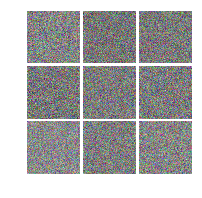

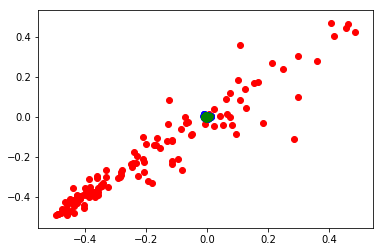

2018-05-23 16:51:07 iteration 100/15000: classifier loss = 0.062443, likelihood loss = 9.449034 = (0.901941+8.547093)


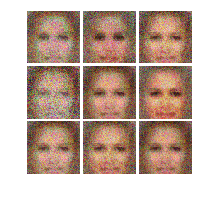

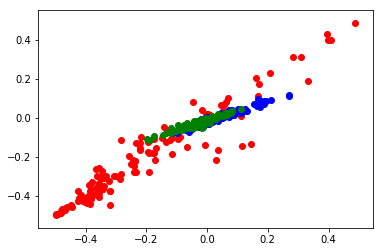

2018-05-23 16:52:40 iteration 200/15000: classifier loss = 0.061506, likelihood loss = 10.097741 = (0.716505+9.381236)


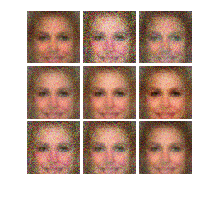

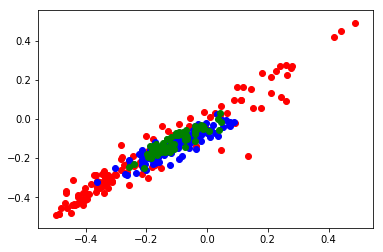

2018-05-23 16:54:07 iteration 300/15000: classifier loss = 0.051480, likelihood loss = 13.116520 = (0.900486+12.216034)


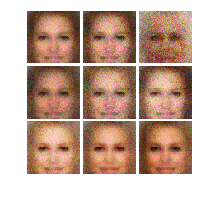

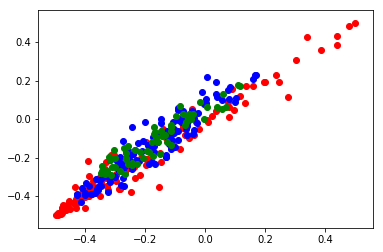

2018-05-23 16:55:37 iteration 400/15000: classifier loss = 0.073981, likelihood loss = 8.992315 = (1.172903+7.819413)


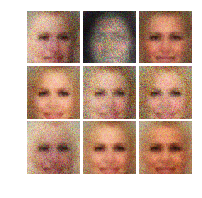

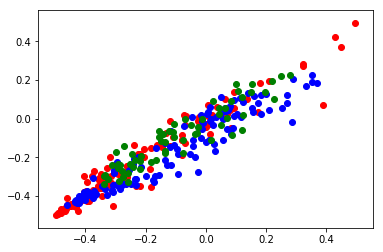

2018-05-23 16:57:08 iteration 500/15000: classifier loss = 0.086329, likelihood loss = 7.865271 = (0.828945+7.036326)


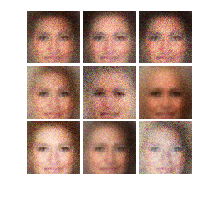

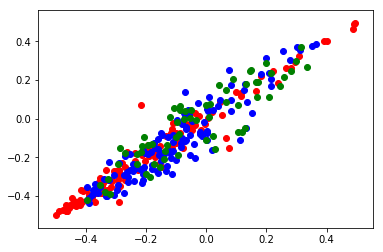

2018-05-23 16:58:41 iteration 600/15000: classifier loss = 0.093884, likelihood loss = 7.685431 = (0.813334+6.872097)


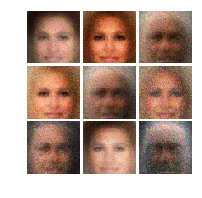

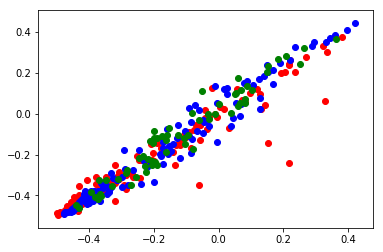

2018-05-23 17:00:13 iteration 700/15000: classifier loss = 0.090603, likelihood loss = 6.581336 = (0.668409+5.912926)


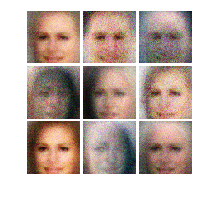

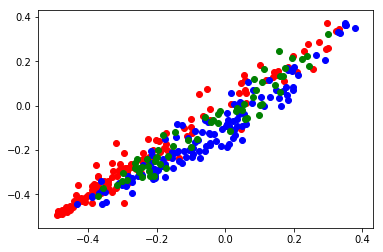

2018-05-23 17:01:45 iteration 800/15000: classifier loss = 0.100246, likelihood loss = 8.824684 = (0.619931+8.204753)


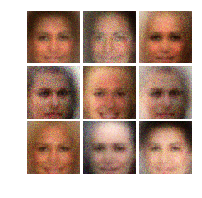

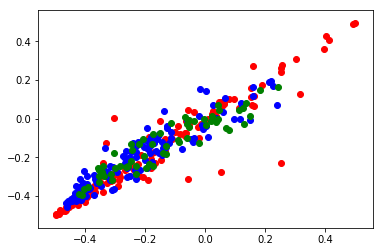

2018-05-23 17:03:16 iteration 900/15000: classifier loss = 0.091846, likelihood loss = 7.546063 = (0.822598+6.723465)


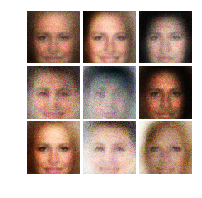

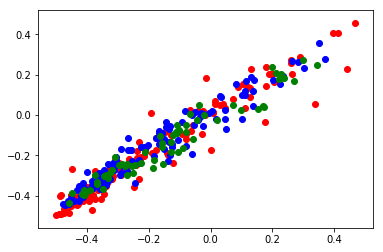

2018-05-23 17:04:48 iteration 1000/15000: classifier loss = 0.127301, likelihood loss = 5.218344 = (0.556998+4.661346)


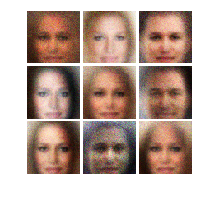

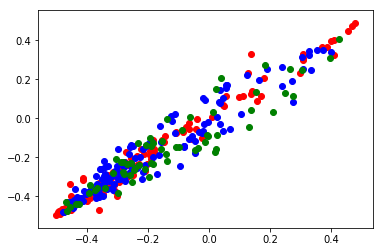

2018-05-23 17:06:17 iteration 1100/15000: classifier loss = 0.113717, likelihood loss = 6.805867 = (0.539209+6.266658)


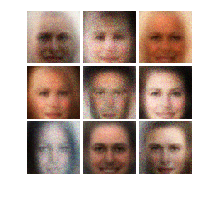

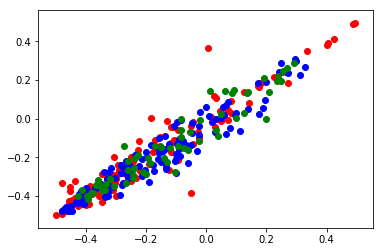

2018-05-23 17:07:50 iteration 1200/15000: classifier loss = 0.111673, likelihood loss = 6.528073 = (0.488876+6.039197)


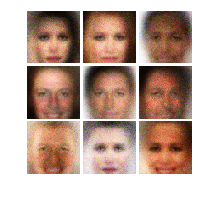

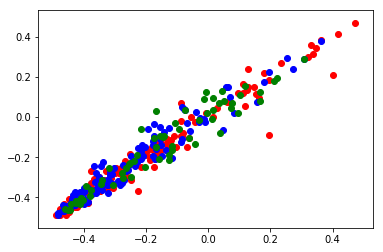

2018-05-23 17:09:23 iteration 1300/15000: classifier loss = 0.102100, likelihood loss = 7.361665 = (0.382763+6.978903)


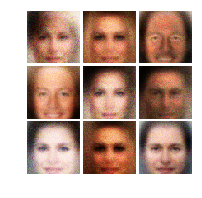

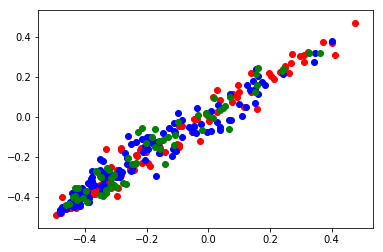

2018-05-23 17:10:54 iteration 1400/15000: classifier loss = 0.125221, likelihood loss = 6.908426 = (0.415929+6.492496)


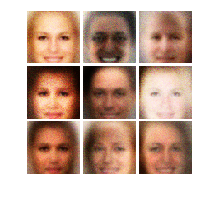

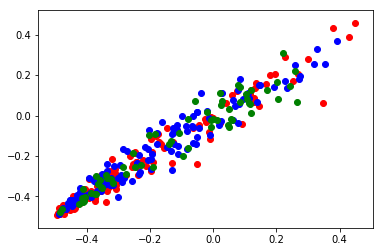

2018-05-23 17:12:27 iteration 1500/15000: classifier loss = 0.118785, likelihood loss = 5.313392 = (0.403231+4.910161)


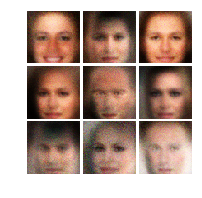

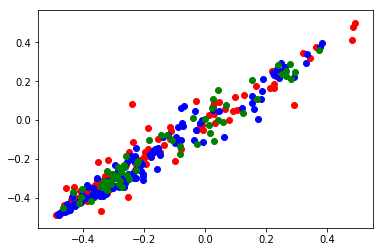

2018-05-23 17:14:03 iteration 1600/15000: classifier loss = 0.111142, likelihood loss = 7.018746 = (0.386657+6.632089)


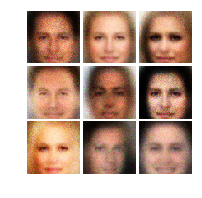

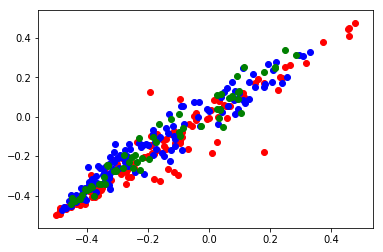

2018-05-23 17:15:35 iteration 1700/15000: classifier loss = 0.102367, likelihood loss = 6.920125 = (0.389481+6.530644)


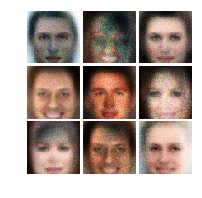

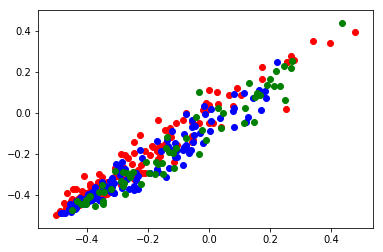

2018-05-23 17:17:07 iteration 1800/15000: classifier loss = 0.106721, likelihood loss = 5.915613 = (0.357200+5.558413)


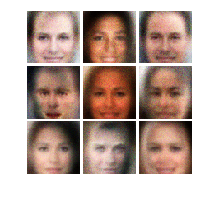

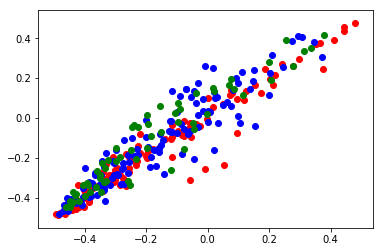

2018-05-23 17:18:39 iteration 1900/15000: classifier loss = 0.125144, likelihood loss = 5.840947 = (0.322857+5.518090)


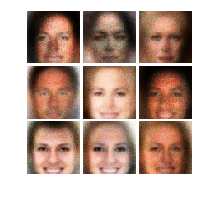

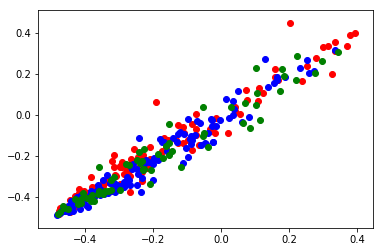

2018-05-23 17:20:11 iteration 2000/15000: classifier loss = 0.116840, likelihood loss = 6.096315 = (0.302542+5.793774)


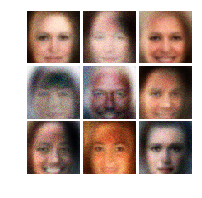

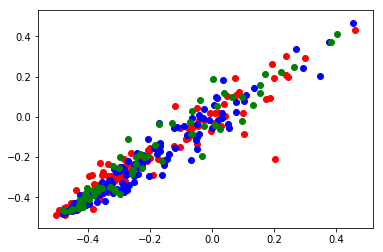

2018-05-23 17:21:45 iteration 2100/15000: classifier loss = 0.134211, likelihood loss = 4.851579 = (0.325930+4.525649)


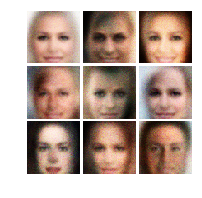

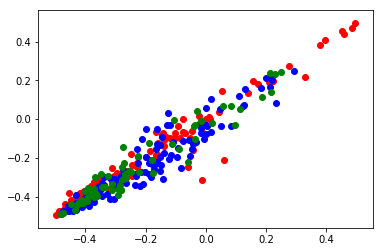

2018-05-23 17:23:18 iteration 2200/15000: classifier loss = 0.113913, likelihood loss = 6.179077 = (0.258253+5.920824)


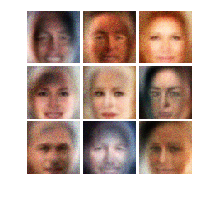

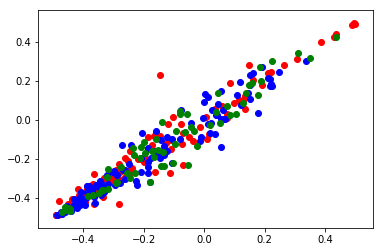

2018-05-23 17:24:51 iteration 2300/15000: classifier loss = 0.130502, likelihood loss = 5.271545 = (0.292360+4.979186)


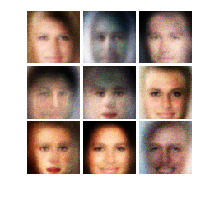

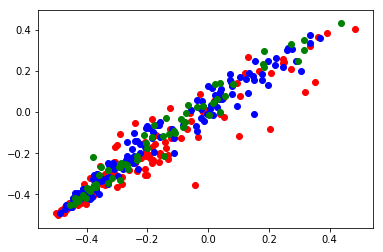

2018-05-23 17:26:23 iteration 2400/15000: classifier loss = 0.102970, likelihood loss = 6.009596 = (0.255982+5.753614)


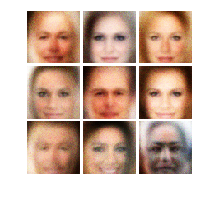

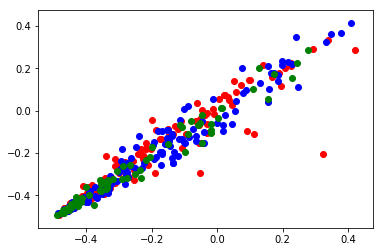

2018-05-23 17:27:55 iteration 2500/15000: classifier loss = 0.125687, likelihood loss = 5.519907 = (0.281178+5.238729)


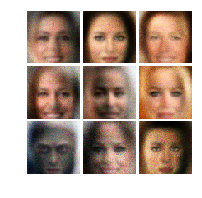

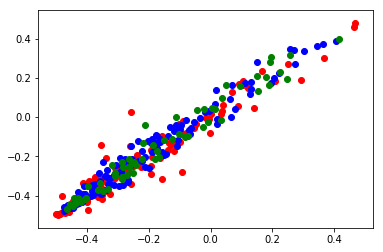

2018-05-23 17:29:27 iteration 2600/15000: classifier loss = 0.135541, likelihood loss = 5.403696 = (0.252728+5.150969)


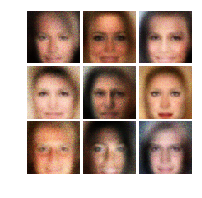

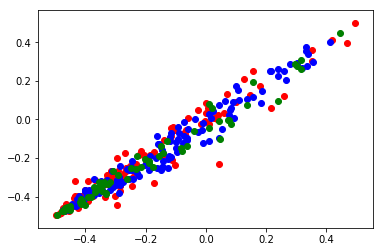

2018-05-23 17:31:01 iteration 2700/15000: classifier loss = 0.119058, likelihood loss = 6.061545 = (0.255679+5.805866)


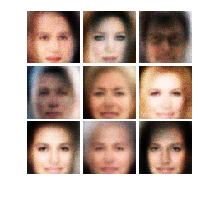

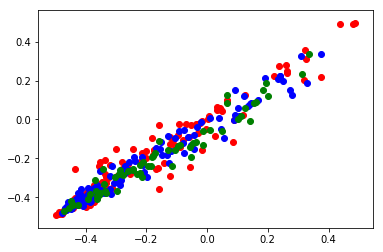

2018-05-23 17:32:32 iteration 2800/15000: classifier loss = 0.128993, likelihood loss = 5.583579 = (0.237252+5.346327)


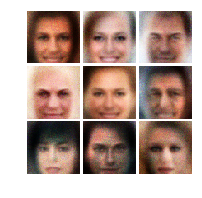

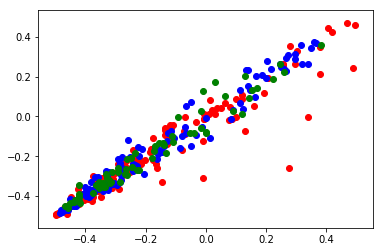

2018-05-23 17:34:04 iteration 2900/15000: classifier loss = 0.121313, likelihood loss = 5.670481 = (0.237840+5.432641)


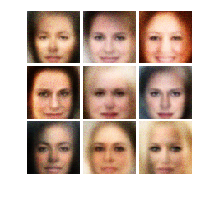

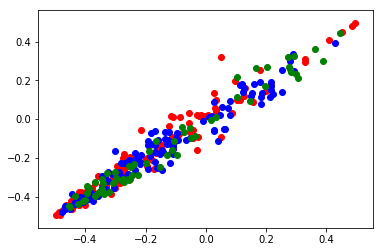

2018-05-23 17:35:34 iteration 3000/15000: classifier loss = 0.099006, likelihood loss = 6.206628 = (0.225512+5.981116)


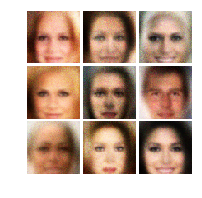

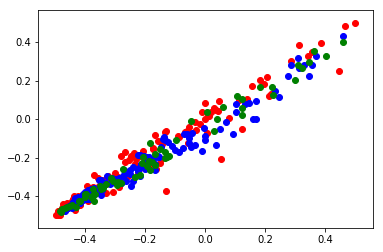

2018-05-23 17:37:06 iteration 3100/15000: classifier loss = 0.114221, likelihood loss = 5.587011 = (0.233892+5.353119)


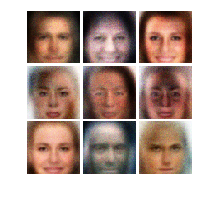

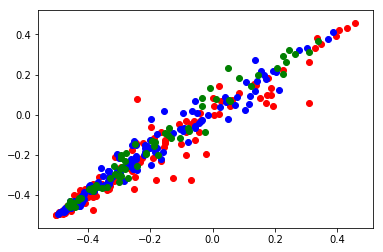

2018-05-23 17:38:42 iteration 3200/15000: classifier loss = 0.117496, likelihood loss = 5.597106 = (0.208015+5.389090)


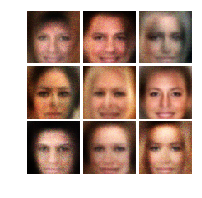

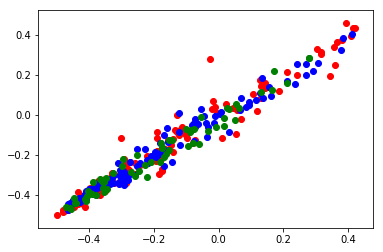

2018-05-23 17:40:13 iteration 3300/15000: classifier loss = 0.115369, likelihood loss = 5.546587 = (0.203354+5.343234)


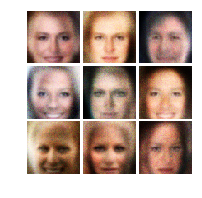

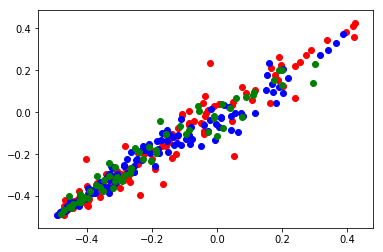

2018-05-23 17:41:43 iteration 3400/15000: classifier loss = 0.120547, likelihood loss = 5.477030 = (0.186477+5.290553)


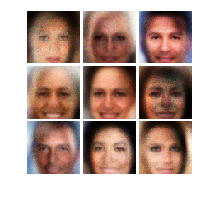

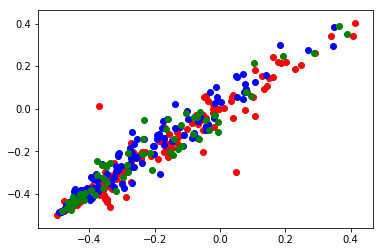

2018-05-23 17:43:16 iteration 3500/15000: classifier loss = 0.127117, likelihood loss = 5.362173 = (0.176746+5.185427)


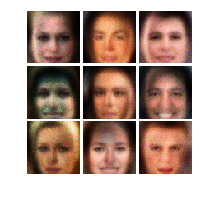

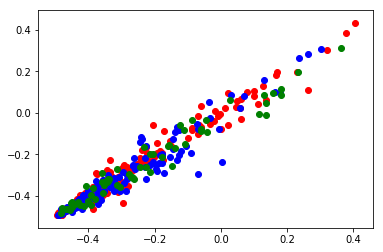

2018-05-23 17:44:49 iteration 3600/15000: classifier loss = 0.126169, likelihood loss = 5.085331 = (0.193757+4.891574)


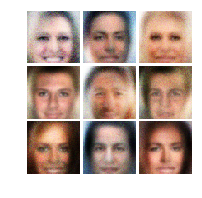

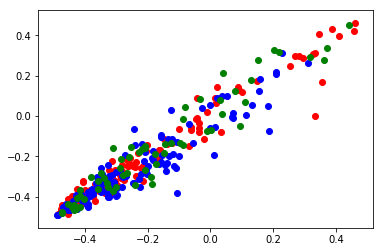

2018-05-23 17:46:22 iteration 3700/15000: classifier loss = 0.122959, likelihood loss = 4.883222 = (0.200933+4.682289)


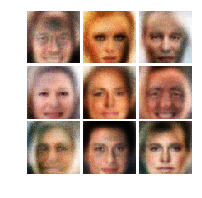

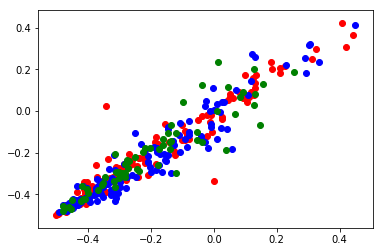

2018-05-23 17:47:56 iteration 3800/15000: classifier loss = 0.114028, likelihood loss = 6.421627 = (0.191275+6.230352)


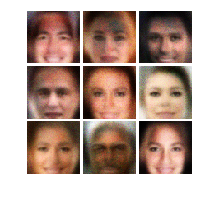

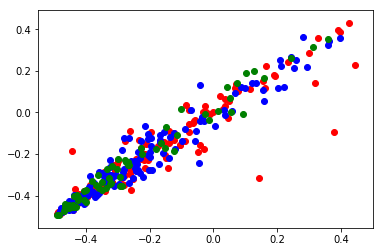

2018-05-23 17:49:28 iteration 3900/15000: classifier loss = 0.111073, likelihood loss = 5.925800 = (0.171627+5.754173)


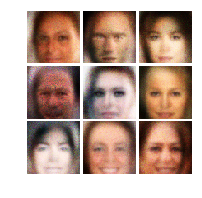

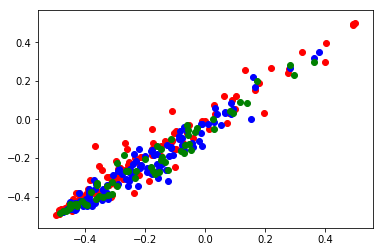

2018-05-23 17:51:01 iteration 4000/15000: classifier loss = 0.120566, likelihood loss = 5.381733 = (0.188960+5.192773)


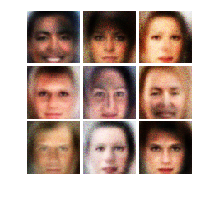

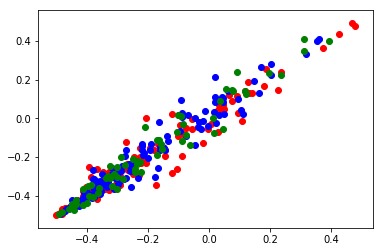

2018-05-23 17:52:34 iteration 4100/15000: classifier loss = 0.115078, likelihood loss = 6.719460 = (0.167031+6.552430)


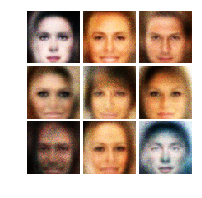

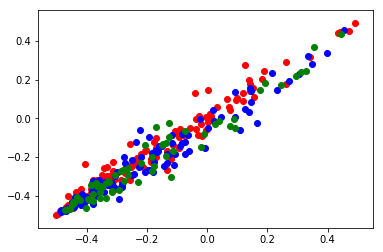

2018-05-23 17:54:07 iteration 4200/15000: classifier loss = 0.121843, likelihood loss = 5.227487 = (0.179338+5.048149)


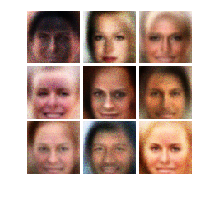

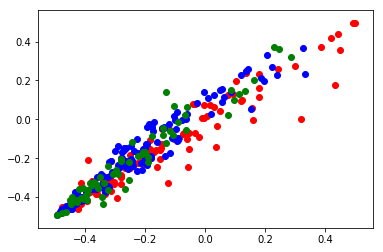

2018-05-23 17:55:38 iteration 4300/15000: classifier loss = 0.122886, likelihood loss = 5.261997 = (0.189164+5.072833)


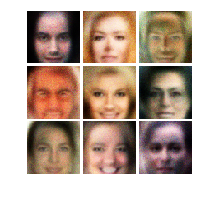

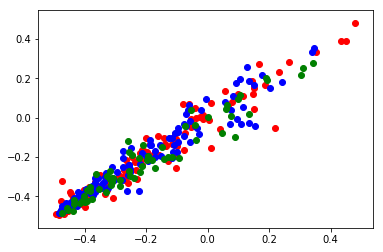

2018-05-23 17:57:11 iteration 4400/15000: classifier loss = 0.124741, likelihood loss = 4.992491 = (0.209494+4.782998)


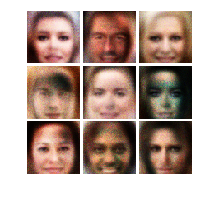

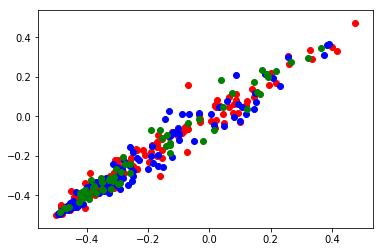

2018-05-23 17:58:42 iteration 4500/15000: classifier loss = 0.107745, likelihood loss = 5.717992 = (0.163255+5.554738)


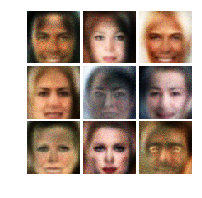

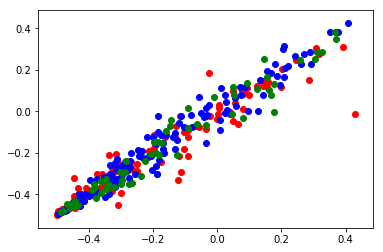

2018-05-23 18:00:13 iteration 4600/15000: classifier loss = 0.126962, likelihood loss = 5.545336 = (0.231979+5.313357)


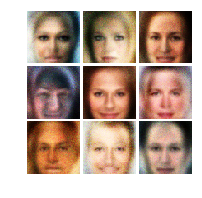

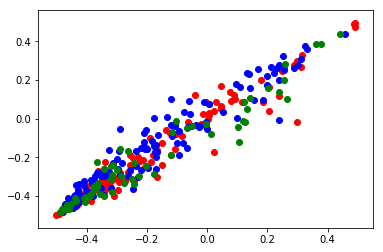

2018-05-23 18:01:44 iteration 4700/15000: classifier loss = 0.124139, likelihood loss = 5.491840 = (0.184776+5.307064)


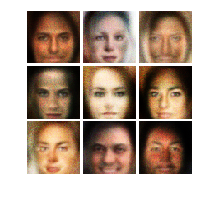

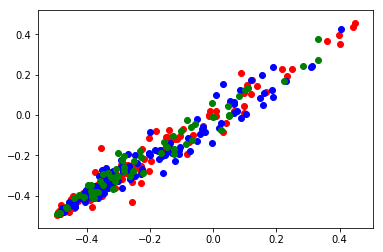

2018-05-23 18:03:22 iteration 4800/15000: classifier loss = 0.123346, likelihood loss = 4.818511 = (0.163335+4.655176)


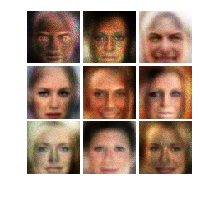

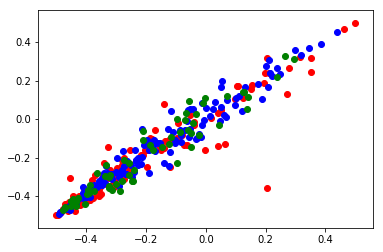

2018-05-23 18:04:55 iteration 4900/15000: classifier loss = 0.135076, likelihood loss = 4.227507 = (0.176333+4.051175)


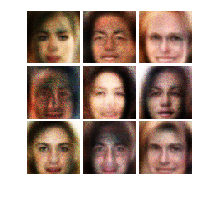

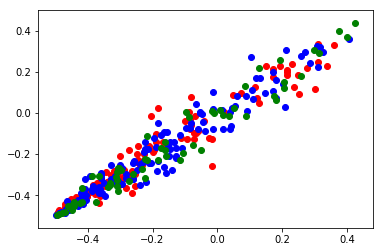

2018-05-23 18:06:27 iteration 5000/15000: classifier loss = 0.123398, likelihood loss = 5.217481 = (0.196240+5.021241)


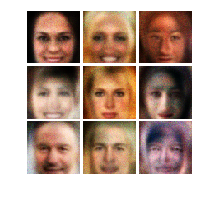

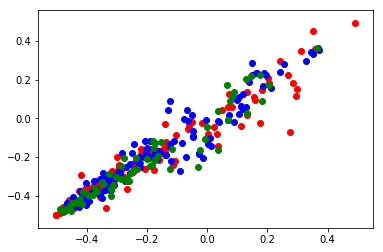

2018-05-23 18:07:58 iteration 5100/15000: classifier loss = 0.131061, likelihood loss = 4.880641 = (0.172033+4.708608)


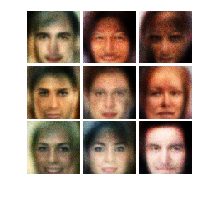

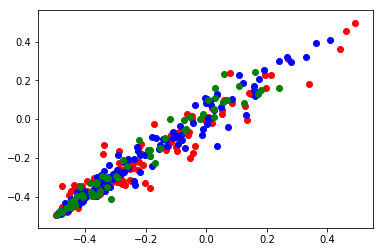

2018-05-23 18:09:29 iteration 5200/15000: classifier loss = 0.118609, likelihood loss = 5.296363 = (0.168084+5.128279)


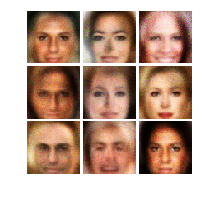

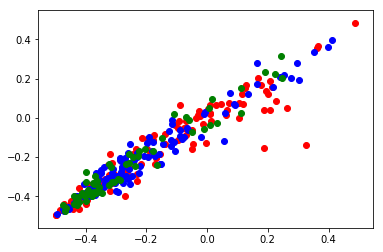

2018-05-23 18:11:00 iteration 5300/15000: classifier loss = 0.117584, likelihood loss = 5.545367 = (0.184739+5.360628)


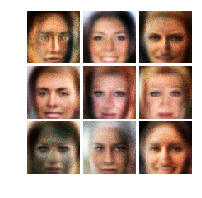

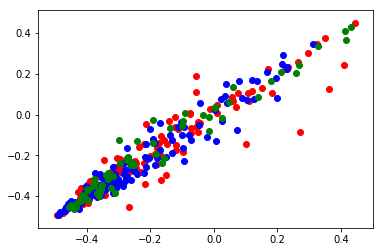

2018-05-23 18:12:30 iteration 5400/15000: classifier loss = 0.120140, likelihood loss = 5.026087 = (0.169796+4.856290)


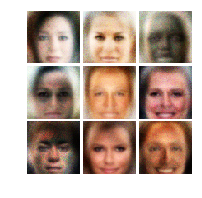

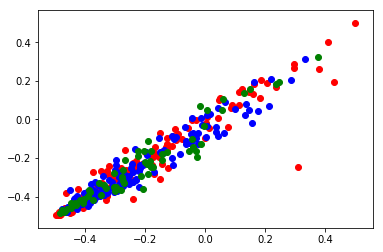

2018-05-23 18:14:01 iteration 5500/15000: classifier loss = 0.122709, likelihood loss = 5.404758 = (0.178585+5.226174)


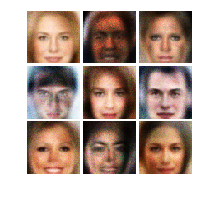

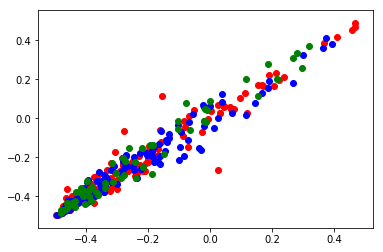

2018-05-23 18:15:32 iteration 5600/15000: classifier loss = 0.131320, likelihood loss = 5.712611 = (0.174928+5.537683)


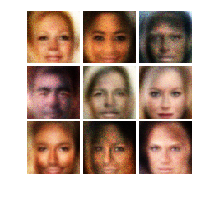

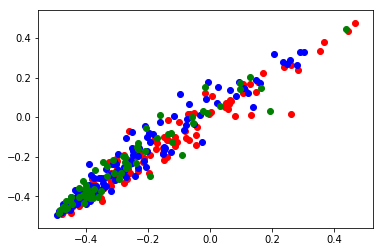

2018-05-23 18:17:04 iteration 5700/15000: classifier loss = 0.127994, likelihood loss = 5.939610 = (0.168443+5.771168)


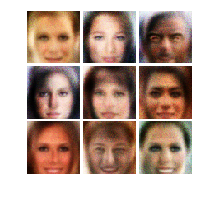

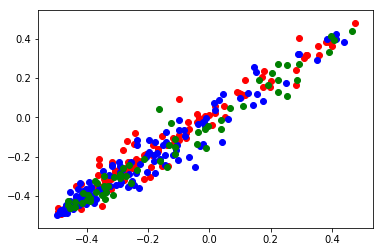

2018-05-23 18:18:34 iteration 5800/15000: classifier loss = 0.130083, likelihood loss = 5.152490 = (0.192382+4.960108)


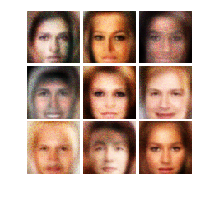

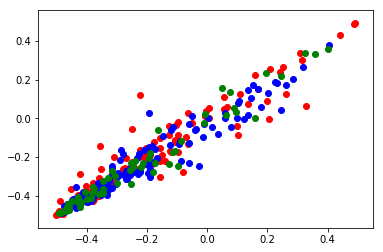

2018-05-23 18:20:06 iteration 5900/15000: classifier loss = 0.131197, likelihood loss = 5.058724 = (0.170058+4.888667)


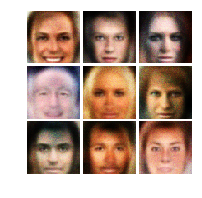

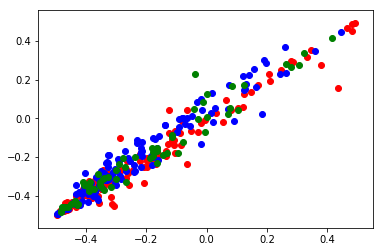

2018-05-23 18:21:35 iteration 6000/15000: classifier loss = 0.133905, likelihood loss = 4.872636 = (0.173590+4.699046)


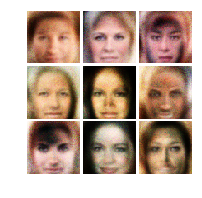

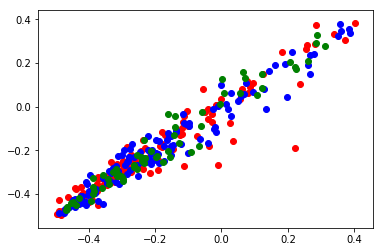

2018-05-23 18:23:03 iteration 6100/15000: classifier loss = 0.127451, likelihood loss = 5.577847 = (0.171935+5.405913)


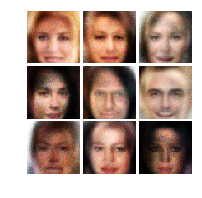

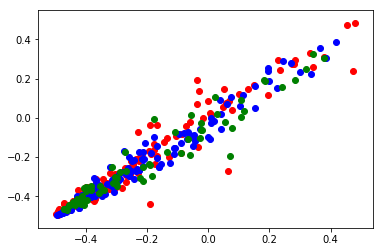

2018-05-23 18:24:32 iteration 6200/15000: classifier loss = 0.130455, likelihood loss = 5.734556 = (0.181088+5.553467)


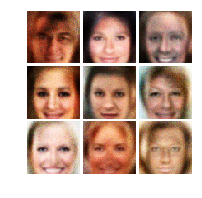

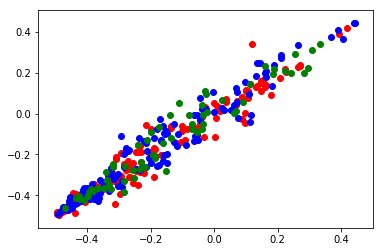

2018-05-23 18:26:02 iteration 6300/15000: classifier loss = 0.125021, likelihood loss = 5.464675 = (0.166460+5.298215)


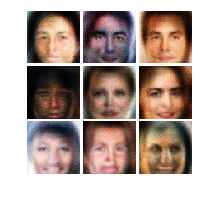

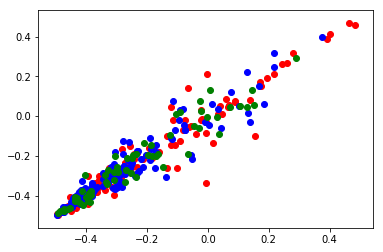

2018-05-23 18:27:37 iteration 6400/15000: classifier loss = 0.127058, likelihood loss = 5.366238 = (0.170174+5.196064)


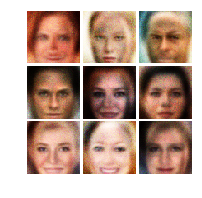

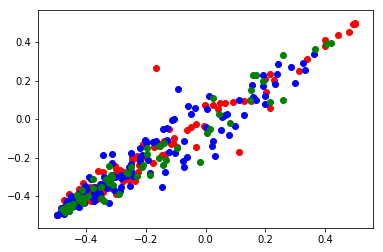

2018-05-23 18:29:06 iteration 6500/15000: classifier loss = 0.126990, likelihood loss = 5.712320 = (0.172327+5.539993)


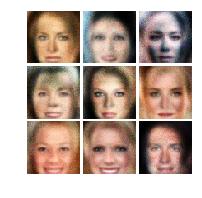

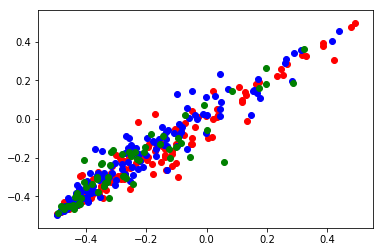

2018-05-23 18:30:37 iteration 6600/15000: classifier loss = 0.123726, likelihood loss = 5.272865 = (0.172804+5.100062)


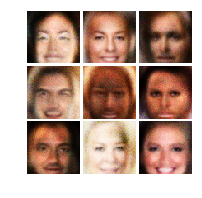

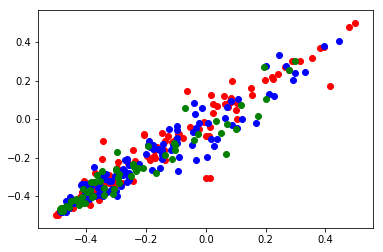

2018-05-23 18:32:05 iteration 6700/15000: classifier loss = 0.140256, likelihood loss = 4.547614 = (0.197006+4.350608)


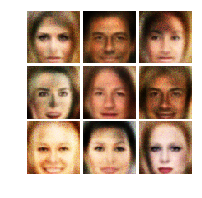

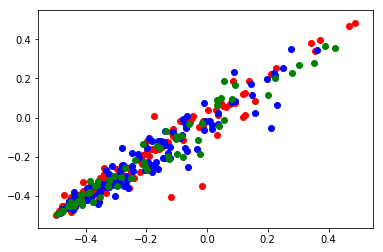

2018-05-23 18:33:34 iteration 6800/15000: classifier loss = 0.134105, likelihood loss = 4.872983 = (0.176874+4.696109)


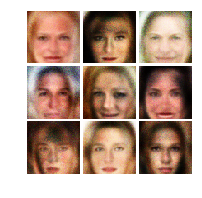

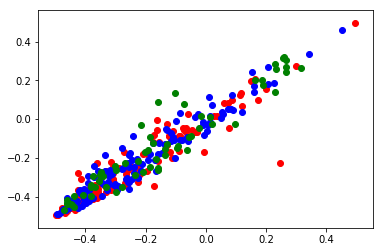

2018-05-23 18:35:01 iteration 6900/15000: classifier loss = 0.134609, likelihood loss = 4.943765 = (0.183639+4.760126)


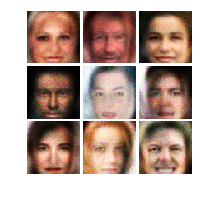

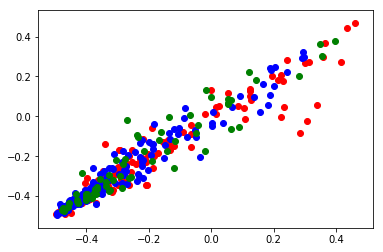

2018-05-23 18:36:29 iteration 7000/15000: classifier loss = 0.125222, likelihood loss = 6.005013 = (0.158771+5.846242)


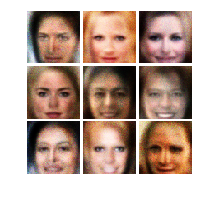

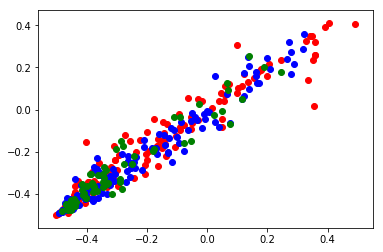

2018-05-23 18:37:57 iteration 7100/15000: classifier loss = 0.125334, likelihood loss = 5.469325 = (0.185605+5.283720)


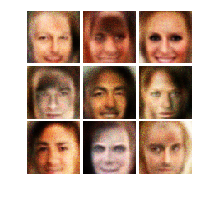

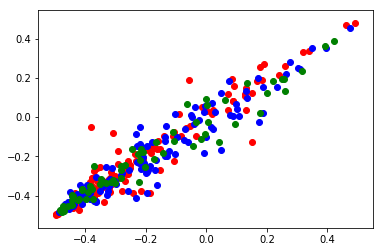

2018-05-23 18:39:27 iteration 7200/15000: classifier loss = 0.131552, likelihood loss = 5.507512 = (0.178642+5.328869)


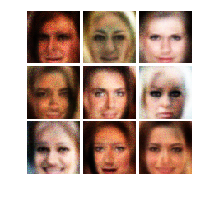

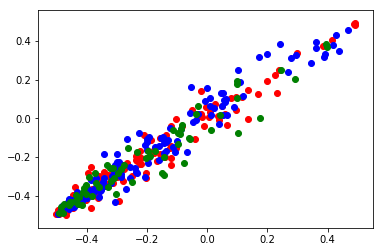

2018-05-23 18:40:54 iteration 7300/15000: classifier loss = 0.136282, likelihood loss = 5.014457 = (0.165166+4.849291)


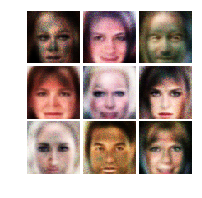

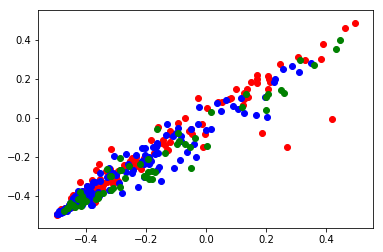

2018-05-23 18:42:21 iteration 7400/15000: classifier loss = 0.132162, likelihood loss = 5.041386 = (0.171050+4.870336)


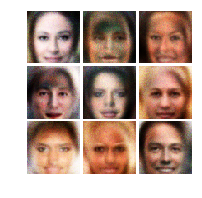

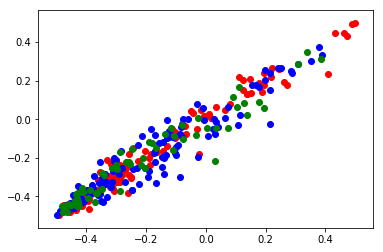

2018-05-23 18:43:51 iteration 7500/15000: classifier loss = 0.136983, likelihood loss = 5.117440 = (0.176564+4.940876)


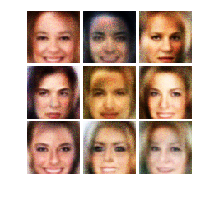

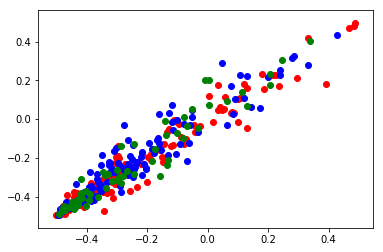

2018-05-23 18:45:22 iteration 7600/15000: classifier loss = 0.132003, likelihood loss = 5.231662 = (0.210967+5.020696)


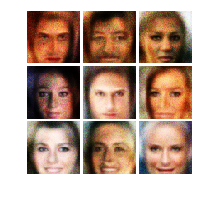

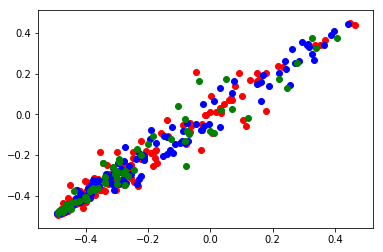

2018-05-23 18:46:53 iteration 7700/15000: classifier loss = 0.124438, likelihood loss = 4.619745 = (0.202175+4.417570)


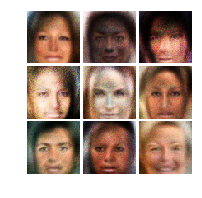

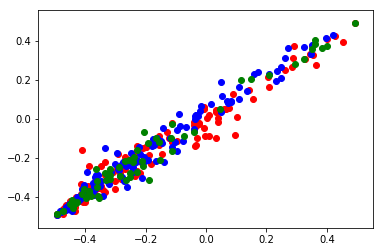

2018-05-23 18:48:21 iteration 7800/15000: classifier loss = 0.140606, likelihood loss = 5.027391 = (0.183438+4.843953)


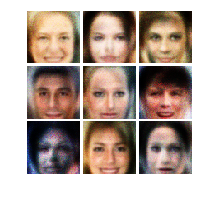

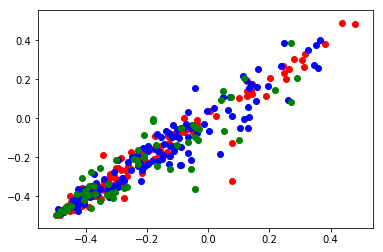

2018-05-23 18:49:52 iteration 7900/15000: classifier loss = 0.126248, likelihood loss = 5.688018 = (0.180559+5.507459)


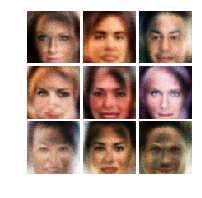

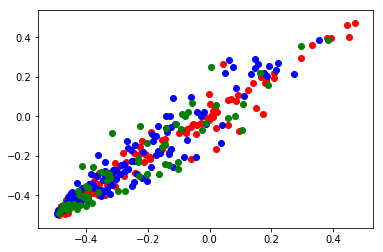

2018-05-23 18:51:27 iteration 8000/15000: classifier loss = 0.131286, likelihood loss = 5.510994 = (0.193480+5.317513)


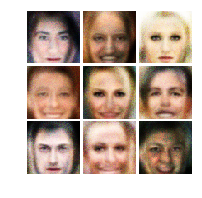

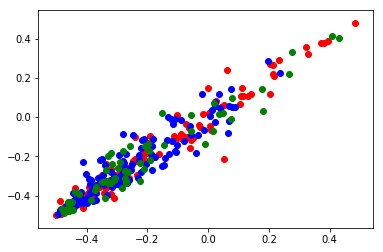

2018-05-23 18:52:58 iteration 8100/15000: classifier loss = 0.122372, likelihood loss = 6.087176 = (0.187313+5.899863)


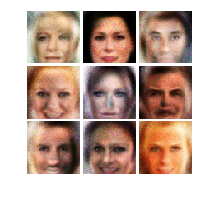

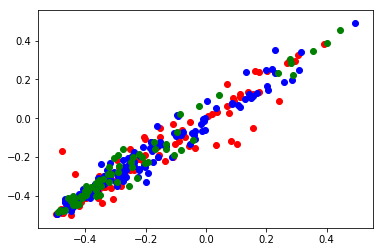

2018-05-23 18:54:30 iteration 8200/15000: classifier loss = 0.135546, likelihood loss = 4.695093 = (0.167901+4.527192)


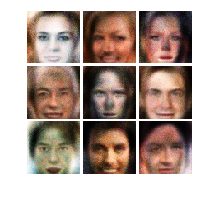

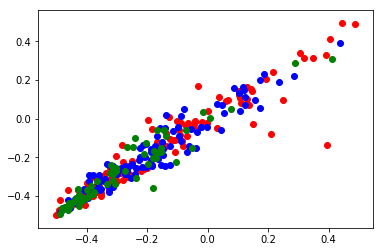

2018-05-23 18:55:59 iteration 8300/15000: classifier loss = 0.128405, likelihood loss = 5.424408 = (0.181095+5.243313)


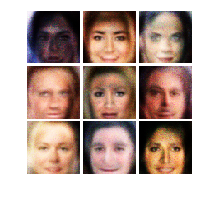

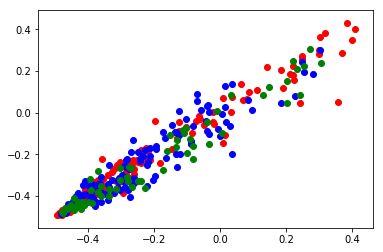

2018-05-23 18:57:30 iteration 8400/15000: classifier loss = 0.131504, likelihood loss = 5.864411 = (0.193862+5.670549)


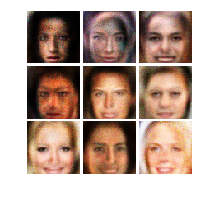

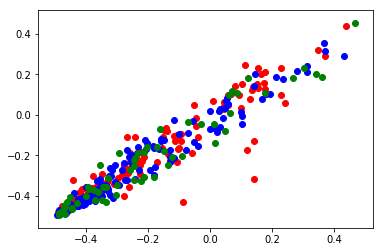

2018-05-23 18:59:02 iteration 8500/15000: classifier loss = 0.132203, likelihood loss = 5.403775 = (0.176040+5.227735)


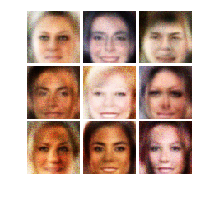

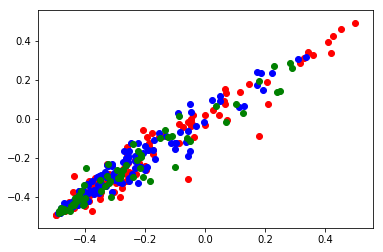

2018-05-23 19:00:32 iteration 8600/15000: classifier loss = 0.137406, likelihood loss = 5.150036 = (0.182243+4.967793)


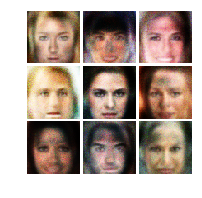

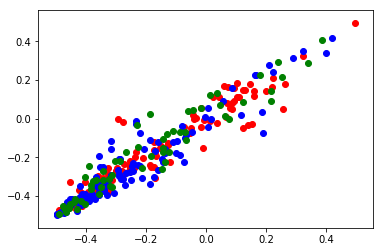

2018-05-23 19:02:03 iteration 8700/15000: classifier loss = 0.123201, likelihood loss = 5.236322 = (0.189911+5.046412)


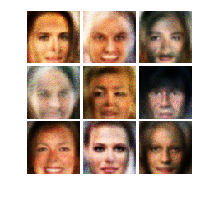

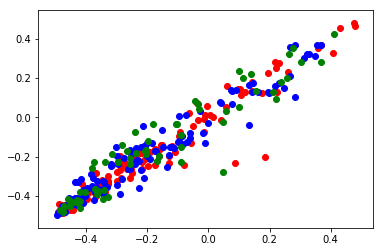

2018-05-23 19:03:33 iteration 8800/15000: classifier loss = 0.130994, likelihood loss = 5.516364 = (0.171479+5.344885)


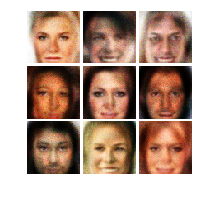

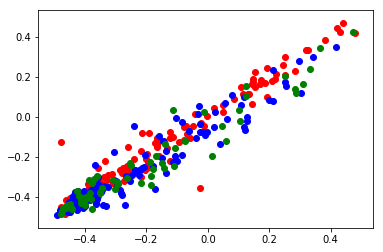

2018-05-23 19:05:04 iteration 8900/15000: classifier loss = 0.137745, likelihood loss = 4.850140 = (0.184356+4.665783)


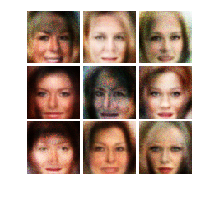

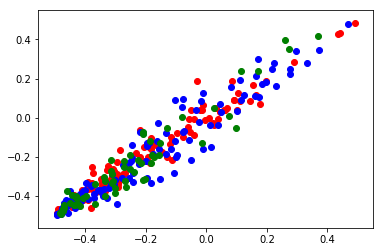

2018-05-23 19:06:34 iteration 9000/15000: classifier loss = 0.125302, likelihood loss = 5.804483 = (0.176344+5.628140)


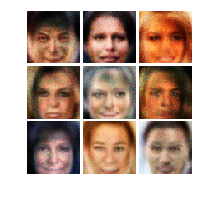

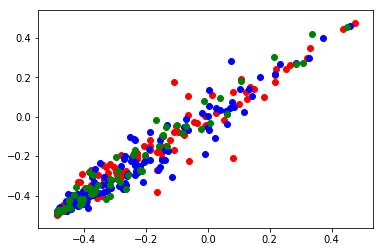

2018-05-23 19:08:05 iteration 9100/15000: classifier loss = 0.137260, likelihood loss = 4.679644 = (0.181799+4.497844)


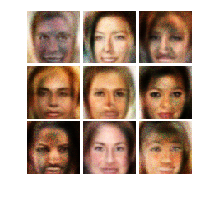

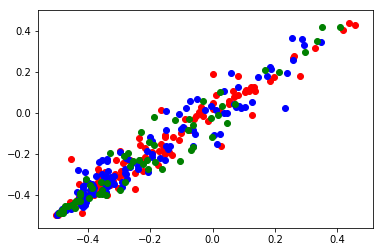

2018-05-23 19:09:36 iteration 9200/15000: classifier loss = 0.121533, likelihood loss = 5.390989 = (0.180308+5.210680)


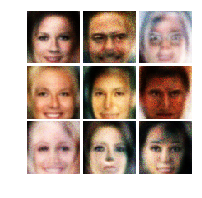

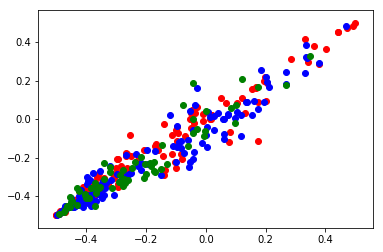

2018-05-23 19:11:06 iteration 9300/15000: classifier loss = 0.134068, likelihood loss = 5.060591 = (0.173028+4.887563)


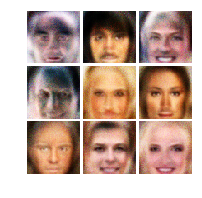

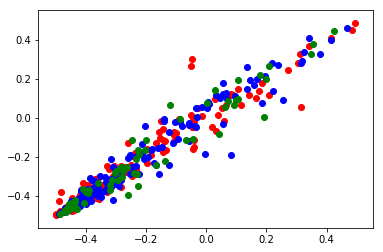

2018-05-23 19:12:37 iteration 9400/15000: classifier loss = 0.127716, likelihood loss = 5.030757 = (0.172546+4.858211)


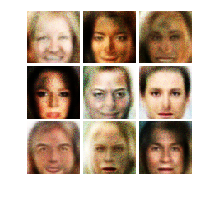

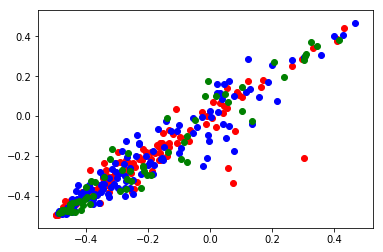

2018-05-23 19:14:12 iteration 9500/15000: classifier loss = 0.125410, likelihood loss = 5.740005 = (0.197525+5.542480)


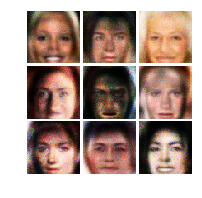

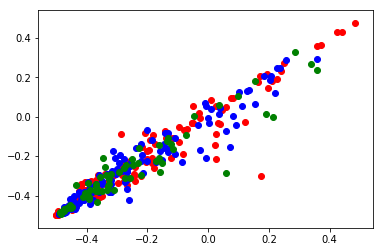

2018-05-23 19:15:42 iteration 9600/15000: classifier loss = 0.126436, likelihood loss = 5.282567 = (0.176504+5.106062)


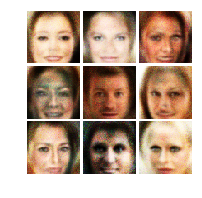

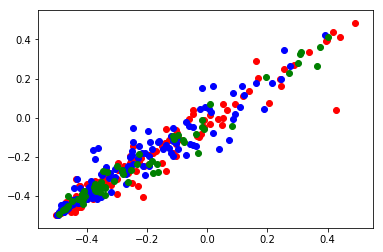

2018-05-23 19:17:12 iteration 9700/15000: classifier loss = 0.135873, likelihood loss = 5.215783 = (0.155978+5.059805)


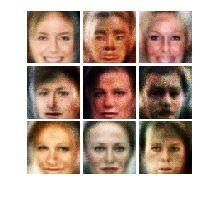

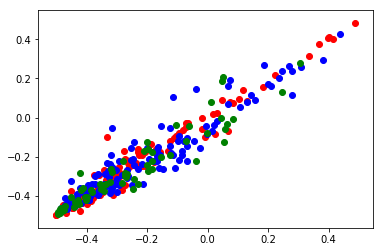

2018-05-23 19:18:42 iteration 9800/15000: classifier loss = 0.121315, likelihood loss = 5.321369 = (0.185805+5.135564)


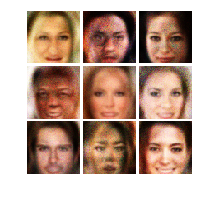

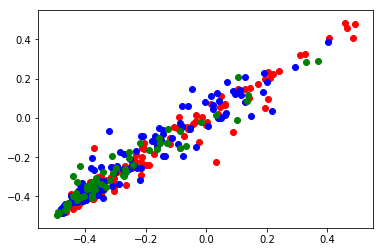

2018-05-23 19:20:12 iteration 9900/15000: classifier loss = 0.119708, likelihood loss = 5.021109 = (0.182204+4.838905)


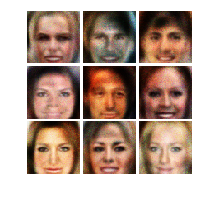

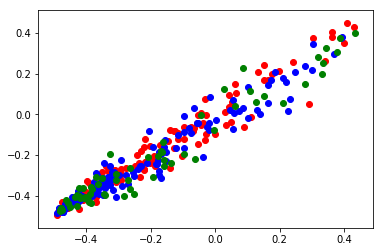

2018-05-23 19:21:41 iteration 10000/15000: classifier loss = 0.132597, likelihood loss = 5.127420 = (0.178859+4.948561)


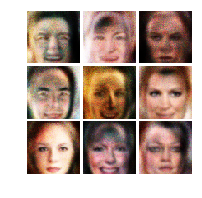

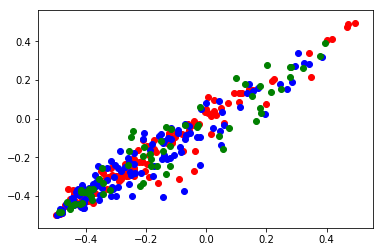

2018-05-23 19:23:10 iteration 10100/15000: classifier loss = 0.133511, likelihood loss = 5.638879 = (0.180588+5.458292)


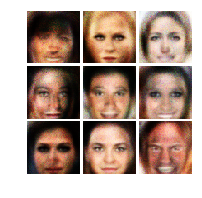

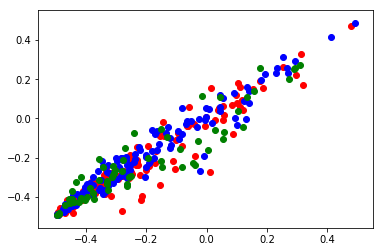

2018-05-23 19:24:41 iteration 10200/15000: classifier loss = 0.124271, likelihood loss = 5.169386 = (0.178275+4.991111)


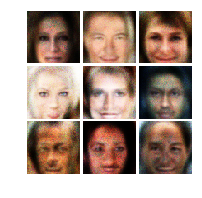

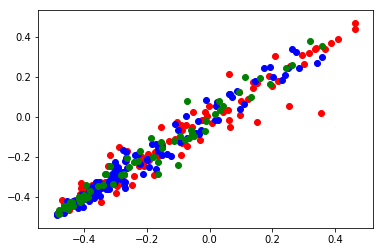

2018-05-23 19:26:11 iteration 10300/15000: classifier loss = 0.110967, likelihood loss = 5.579772 = (0.176674+5.403097)


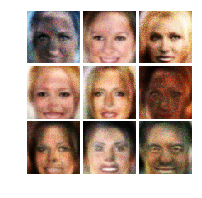

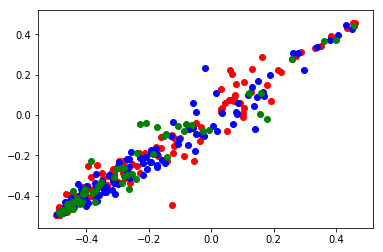

2018-05-23 19:27:40 iteration 10400/15000: classifier loss = 0.132145, likelihood loss = 4.841196 = (0.185551+4.655645)


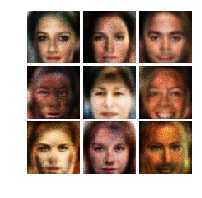

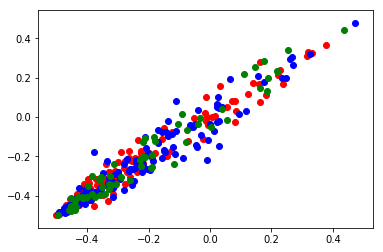

2018-05-23 19:29:10 iteration 10500/15000: classifier loss = 0.123818, likelihood loss = 5.551904 = (0.170994+5.380910)


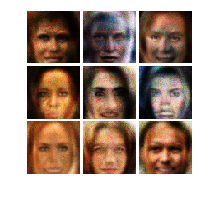

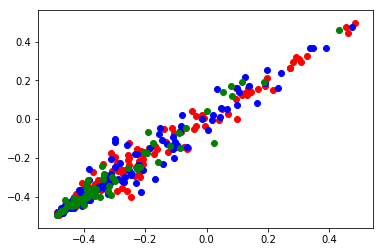

2018-05-23 19:30:40 iteration 10600/15000: classifier loss = 0.138308, likelihood loss = 5.344991 = (0.204606+5.140385)


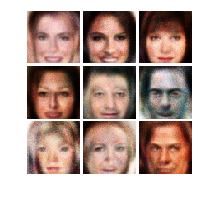

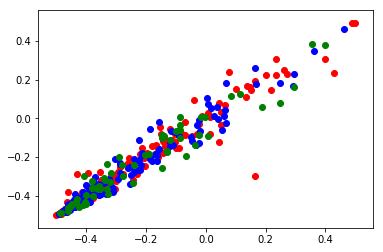

2018-05-23 19:32:11 iteration 10700/15000: classifier loss = 0.126794, likelihood loss = 5.760185 = (0.196424+5.563761)


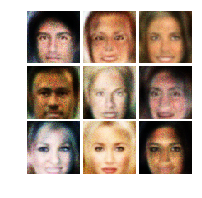

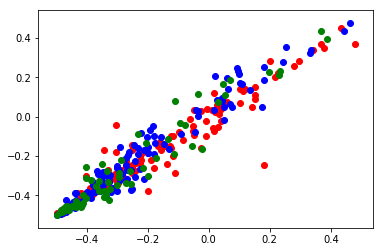

2018-05-23 19:33:43 iteration 10800/15000: classifier loss = 0.142424, likelihood loss = 4.818912 = (0.196669+4.622242)


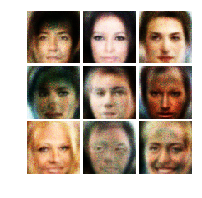

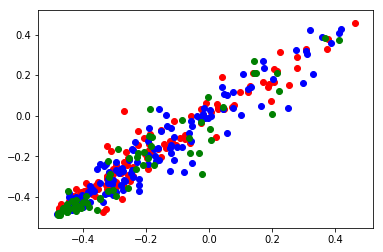

2018-05-23 19:35:14 iteration 10900/15000: classifier loss = 0.135662, likelihood loss = 5.014897 = (0.191896+4.823001)


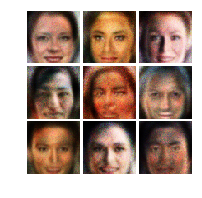

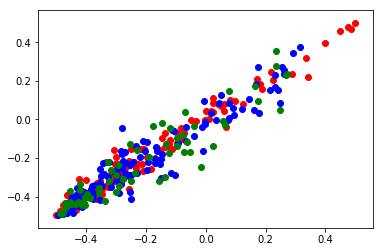

2018-05-23 19:36:43 iteration 11000/15000: classifier loss = 0.127326, likelihood loss = 5.320405 = (0.191131+5.129273)


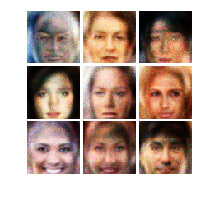

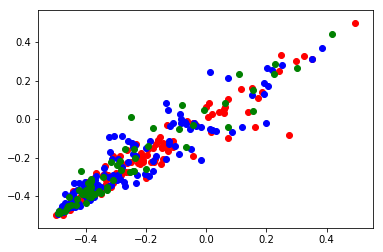

2018-05-23 19:38:17 iteration 11100/15000: classifier loss = 0.134973, likelihood loss = 4.708307 = (0.179578+4.528728)


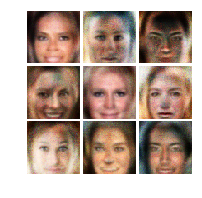

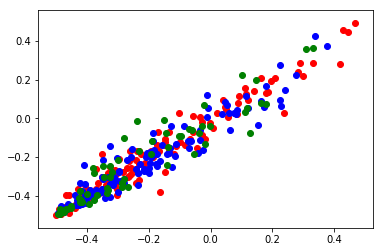

2018-05-23 19:39:48 iteration 11200/15000: classifier loss = 0.133127, likelihood loss = 4.966259 = (0.184634+4.781625)


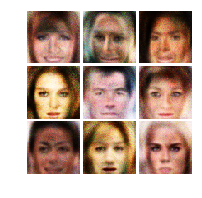

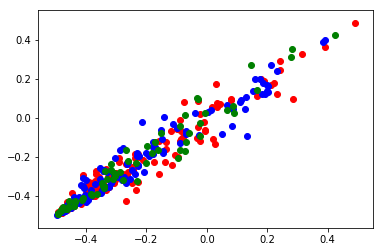

2018-05-23 19:41:15 iteration 11300/15000: classifier loss = 0.123774, likelihood loss = 5.750934 = (0.189149+5.561785)


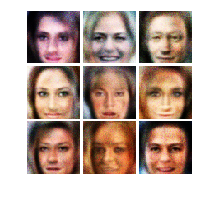

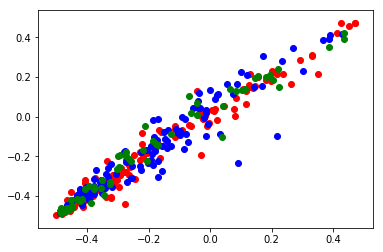

2018-05-23 19:42:45 iteration 11400/15000: classifier loss = 0.130612, likelihood loss = 5.292490 = (0.184683+5.107807)


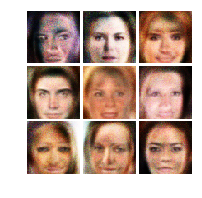

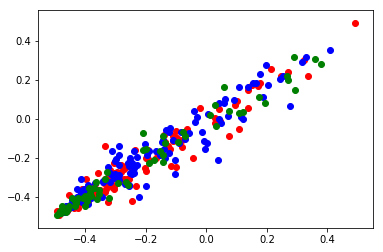

2018-05-23 19:44:14 iteration 11500/15000: classifier loss = 0.130934, likelihood loss = 5.083451 = (0.174340+4.909111)


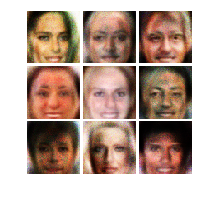

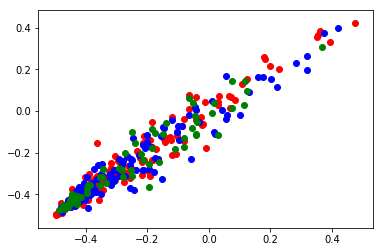

2018-05-23 19:45:42 iteration 11600/15000: classifier loss = 0.121917, likelihood loss = 5.541825 = (0.178736+5.363089)


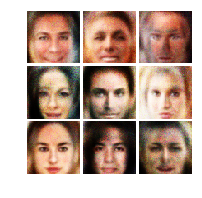

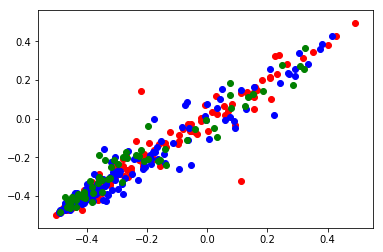

2018-05-23 19:47:09 iteration 11700/15000: classifier loss = 0.132419, likelihood loss = 5.247902 = (0.198115+5.049787)


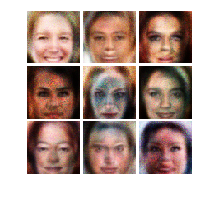

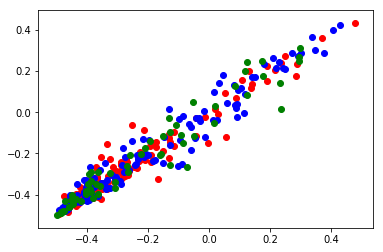

2018-05-23 19:48:37 iteration 11800/15000: classifier loss = 0.135844, likelihood loss = 5.172249 = (0.203981+4.968268)


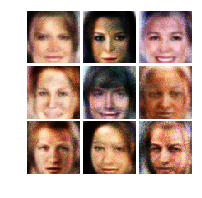

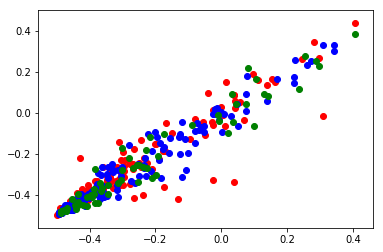

2018-05-23 19:50:04 iteration 11900/15000: classifier loss = 0.132332, likelihood loss = 5.558472 = (0.196079+5.362393)


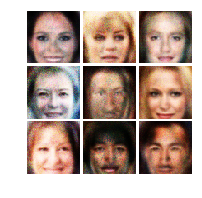

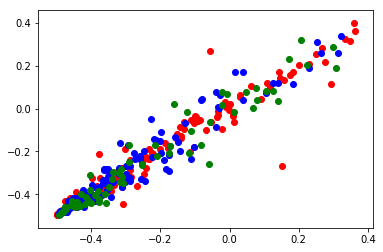

2018-05-23 19:51:33 iteration 12000/15000: classifier loss = 0.119773, likelihood loss = 5.366208 = (0.201745+5.164463)


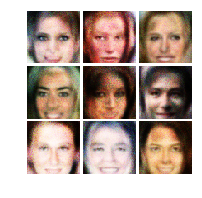

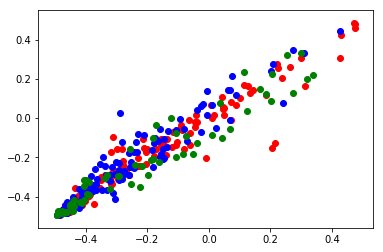

2018-05-23 19:53:02 iteration 12100/15000: classifier loss = 0.129511, likelihood loss = 5.290179 = (0.187380+5.102799)


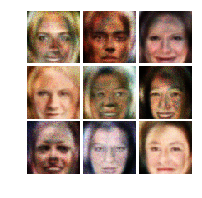

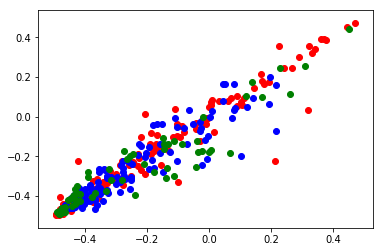

2018-05-23 19:54:33 iteration 12200/15000: classifier loss = 0.132731, likelihood loss = 5.506287 = (0.167254+5.339033)


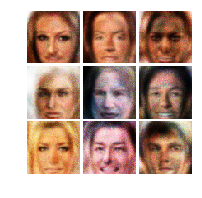

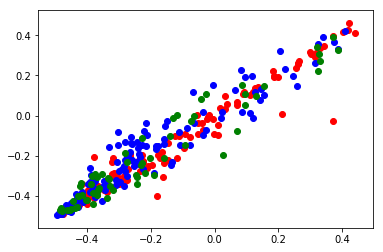

2018-05-23 19:56:01 iteration 12300/15000: classifier loss = 0.133237, likelihood loss = 4.946034 = (0.189513+4.756521)


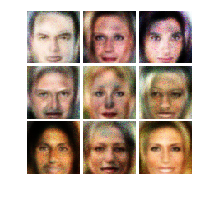

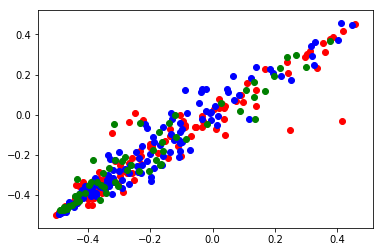

2018-05-23 19:57:30 iteration 12400/15000: classifier loss = 0.128388, likelihood loss = 5.364660 = (0.190947+5.173714)


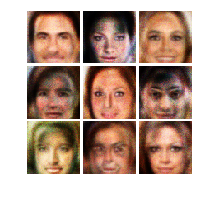

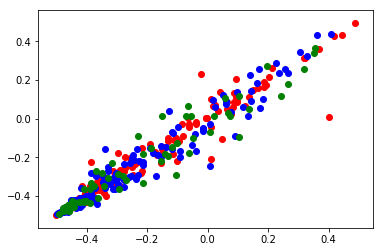

2018-05-23 19:59:01 iteration 12500/15000: classifier loss = 0.123956, likelihood loss = 5.342535 = (0.184688+5.157847)


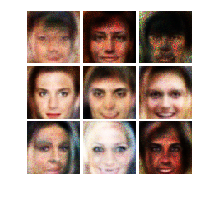

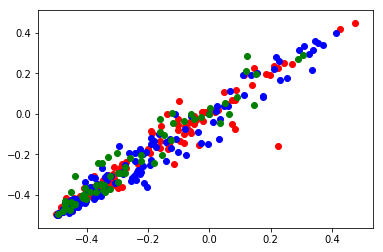

2018-05-23 20:00:34 iteration 12600/15000: classifier loss = 0.126738, likelihood loss = 5.670430 = (0.197240+5.473190)


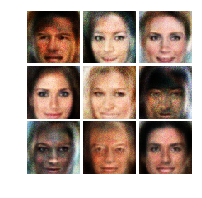

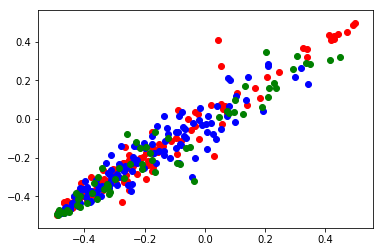

2018-05-23 20:02:09 iteration 12700/15000: classifier loss = 0.127104, likelihood loss = 5.405272 = (0.216140+5.189132)


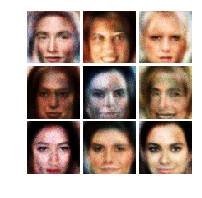

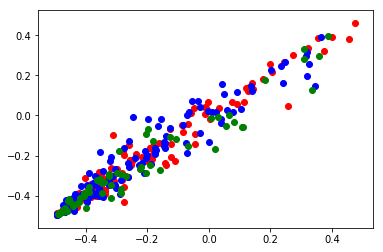

2018-05-23 20:03:41 iteration 12800/15000: classifier loss = 0.123179, likelihood loss = 5.586508 = (0.191590+5.394918)


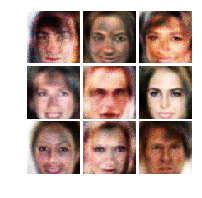

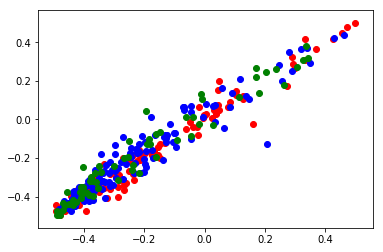

2018-05-23 20:05:14 iteration 12900/15000: classifier loss = 0.125465, likelihood loss = 5.649290 = (0.179951+5.469339)


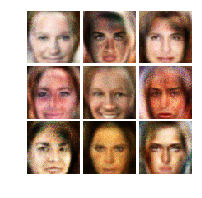

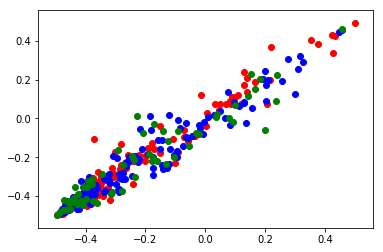

2018-05-23 20:06:46 iteration 13000/15000: classifier loss = 0.122754, likelihood loss = 5.847762 = (0.207540+5.640222)


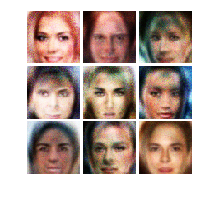

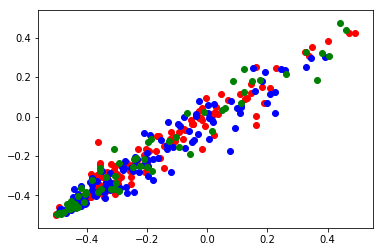

2018-05-23 20:08:17 iteration 13100/15000: classifier loss = 0.127573, likelihood loss = 5.410907 = (0.203880+5.207027)


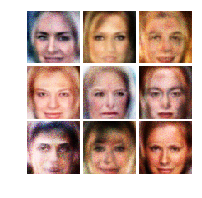

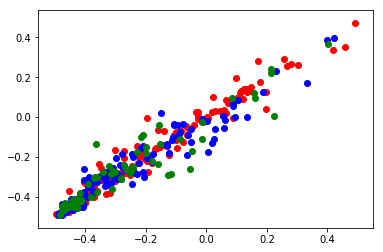

2018-05-23 20:09:47 iteration 13200/15000: classifier loss = 0.123835, likelihood loss = 5.632637 = (0.183210+5.449427)


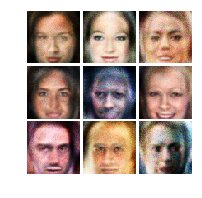

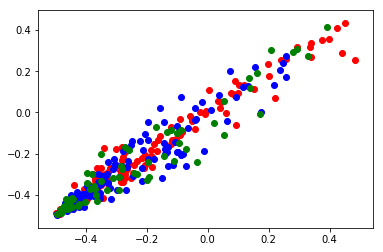

2018-05-23 20:11:16 iteration 13300/15000: classifier loss = 0.133512, likelihood loss = 5.367073 = (0.189739+5.177334)


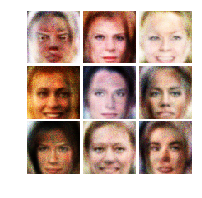

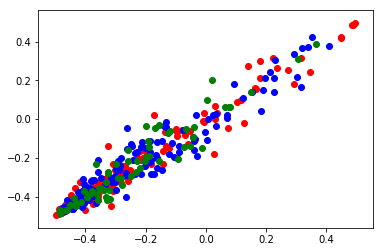

2018-05-23 20:12:48 iteration 13400/15000: classifier loss = 0.128621, likelihood loss = 4.970029 = (0.190218+4.779811)


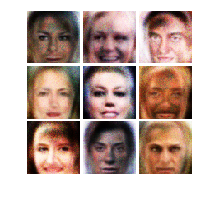

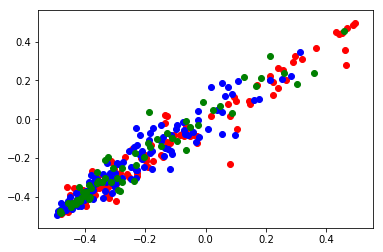

2018-05-23 20:14:18 iteration 13500/15000: classifier loss = 0.127147, likelihood loss = 5.183574 = (0.195477+4.988097)


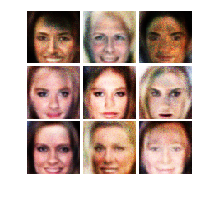

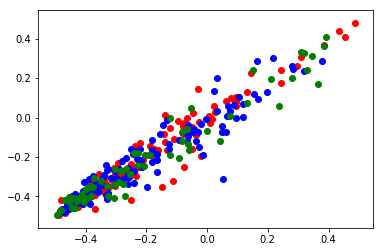

2018-05-23 20:15:49 iteration 13600/15000: classifier loss = 0.125532, likelihood loss = 5.288592 = (0.186794+5.101799)


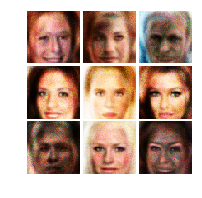

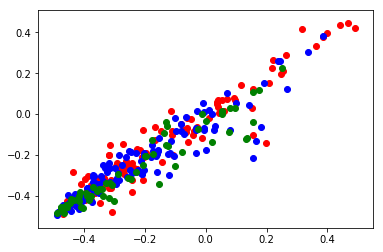

2018-05-23 20:17:19 iteration 13700/15000: classifier loss = 0.117631, likelihood loss = 5.282509 = (0.187543+5.094966)


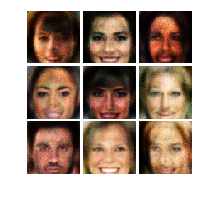

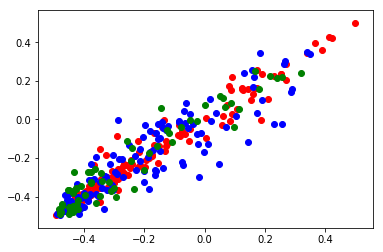

2018-05-23 20:18:49 iteration 13800/15000: classifier loss = 0.129499, likelihood loss = 5.338616 = (0.195019+5.143597)


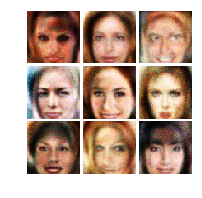

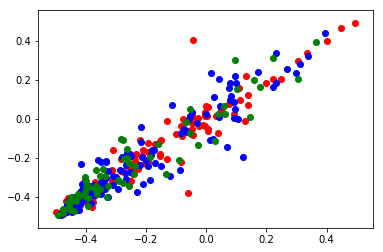

2018-05-23 20:20:20 iteration 13900/15000: classifier loss = 0.132900, likelihood loss = 5.496095 = (0.206482+5.289613)


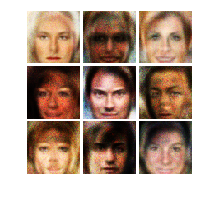

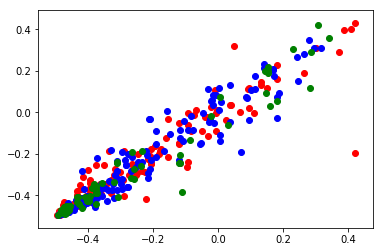

2018-05-23 20:21:50 iteration 14000/15000: classifier loss = 0.122890, likelihood loss = 5.542849 = (0.194191+5.348658)


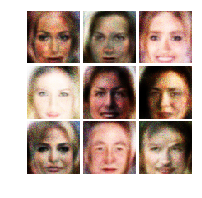

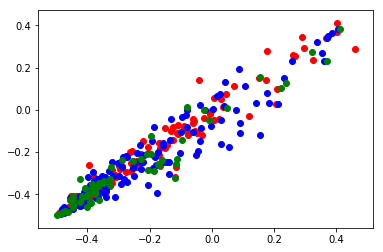

2018-05-23 20:23:20 iteration 14100/15000: classifier loss = 0.122286, likelihood loss = 5.865365 = (0.184688+5.680677)


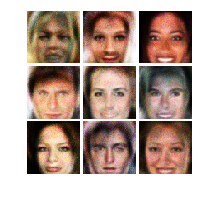

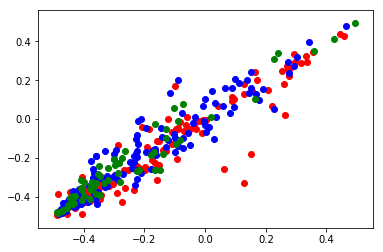

2018-05-23 20:24:51 iteration 14200/15000: classifier loss = 0.122604, likelihood loss = 5.631072 = (0.181498+5.449574)


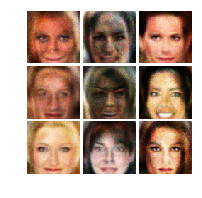

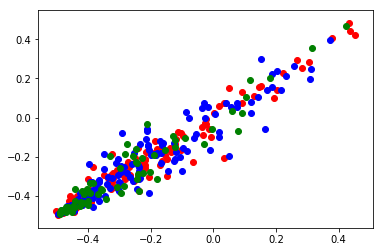

2018-05-23 20:26:25 iteration 14300/15000: classifier loss = 0.110592, likelihood loss = 5.703341 = (0.197919+5.505422)


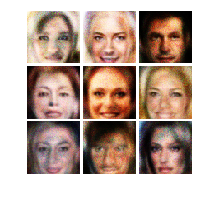

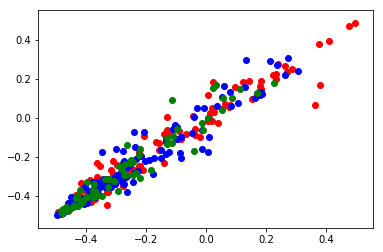

2018-05-23 20:27:56 iteration 14400/15000: classifier loss = 0.115750, likelihood loss = 5.884252 = (0.214412+5.669839)


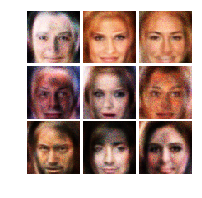

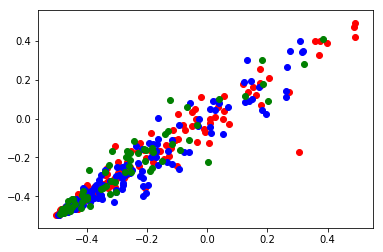

2018-05-23 20:29:28 iteration 14500/15000: classifier loss = 0.125647, likelihood loss = 5.951042 = (0.214746+5.736296)


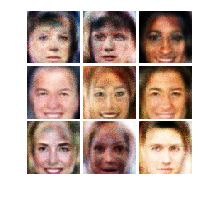

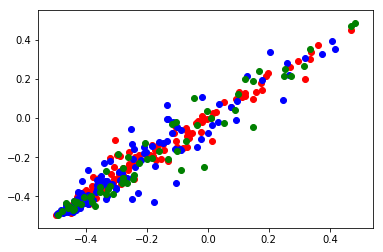

2018-05-23 20:30:59 iteration 14600/15000: classifier loss = 0.114089, likelihood loss = 5.656309 = (0.194400+5.461909)


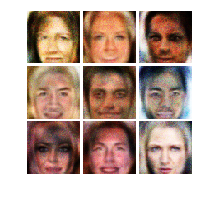

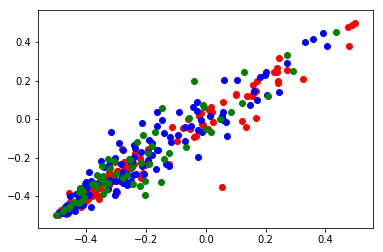

2018-05-23 20:32:30 iteration 14700/15000: classifier loss = 0.124635, likelihood loss = 5.442498 = (0.196627+5.245872)


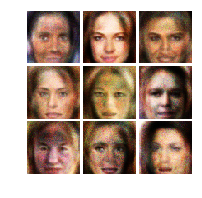

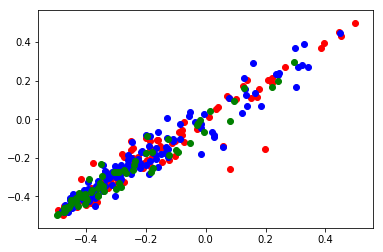

2018-05-23 20:34:01 iteration 14800/15000: classifier loss = 0.111874, likelihood loss = 5.745399 = (0.198463+5.546936)


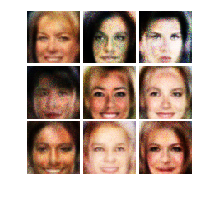

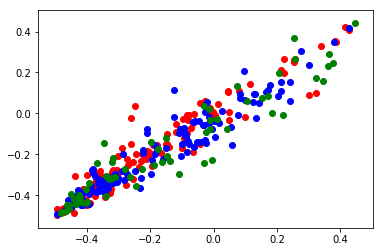

2018-05-23 20:35:32 iteration 14900/15000: classifier loss = 0.116482, likelihood loss = 5.935424 = (0.190824+5.744600)


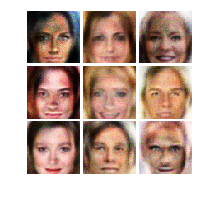

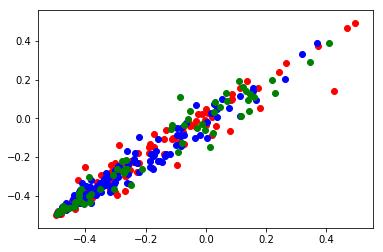

2018-05-23 20:37:01 iteration 15000/15000: classifier loss = 0.120361, likelihood loss = 6.204979 = (0.220964+5.984015)


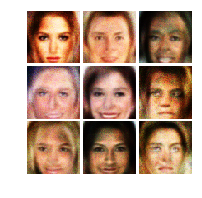

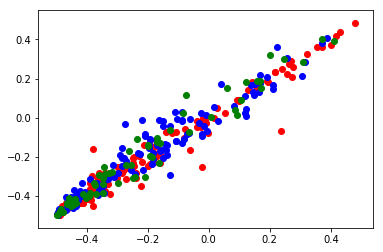

In [9]:
batch_size=128
fake_size=128
noise_size=512
num_iteration=15000
print_every=100


classifier_train=1
vae_train=1

saver=tf.train.Saver()
with tf.Session() as sess:
    tf.global_variables_initializer().run()
#     saver.restore(sess, "parameters/IVRAE/Celeba/IVRAE.ckpt")
    for it in range(num_iteration):
        image,label=make_batch(batch_size,fake_size,noise_size)
        feed_dict={X:image,y:label}
        for t in range(classifier_train):
            _=sess.run([train_step1],feed_dict={X:image,y:label})
        for t in range(vae_train):
            _=sess.run([train_step2],feed_dict={X:image,y:label})
        loss_num,l1,l2,l3=sess.run([tot_loss,tot_latent_loss,tot_classifier_loss,tot_likelihood_loss],feed_dict=feed_dict)
        
        if it==0 or (it+1)%print_every==0 or it==num_iteration-1:
            print(time.strftime('%Y-%m-%d %H:%M:%S',time.localtime(time.time())),
                  'iteration %d/%d:' % (it+1,num_iteration),'classifier loss = %f, likelihood loss = %f = (%f+%f)' % (l2,l1+l3,l1,l3))
            save_path = saver.save(sess, "parameters/IVRAE/Celeba/IVRAE.ckpt")
        
            gene=display()
            
            temp=sess.run(image_his,feed_dict={X:image,y:label})
            temp=temp[-1]
            plt.scatter(temp[:batch_size,1000],temp[:batch_size,1003],c='r')
            plt.scatter(temp[batch_size:(batch_size+fake_size),1000],temp[batch_size:(batch_size+fake_size),1003],c='b')
            plt.scatter(gene[:,1000],gene[:,1003],c='g')
            plt.show()


INFO:tensorflow:Restoring parameters from parameters/IVRAE/Celeba/IVRAE.ckpt


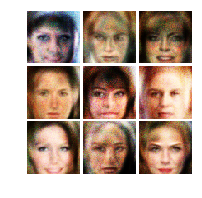

In [15]:
saver=tf.train.Saver()
with tf.Session() as sess:
    tf.global_variables_initializer().run()
    saver.restore(sess, "parameters/IVRAE/Celeba/IVRAE.ckpt")
    display(sv=True)